# Scatter Plots on Maps With Graph Objects

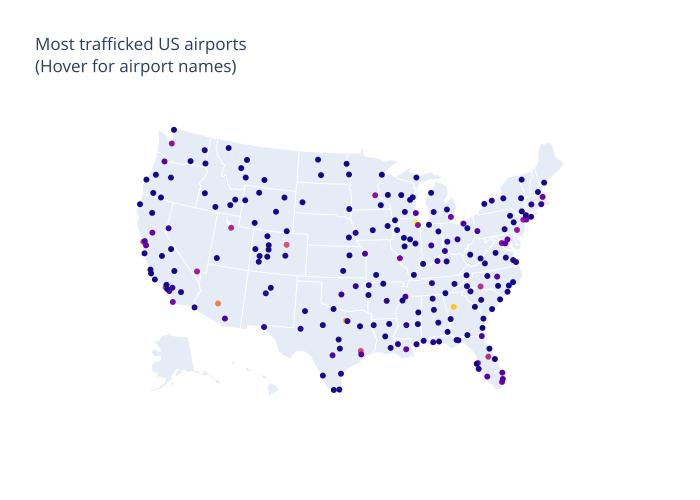

In [2]:
import plotly.graph_objects as go
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df['text'] = df['airport'] + '' + df['city'] + ', ' + df['state'] + '' + 'Arrivals: ' + df['cnt'].astype(str)

fig = go.Figure(data=go.Scattergeo(
    lon          = df['long'],
    lat          = df['lat'],
    text         = df['text'],
    mode         = 'markers',
    marker_color = df['cnt'],
))

fig.update_layout(
    title = 'Most trafficked US airports<br>(Hover for airport names)',
    geo_scope='usa',
)

fig.show()

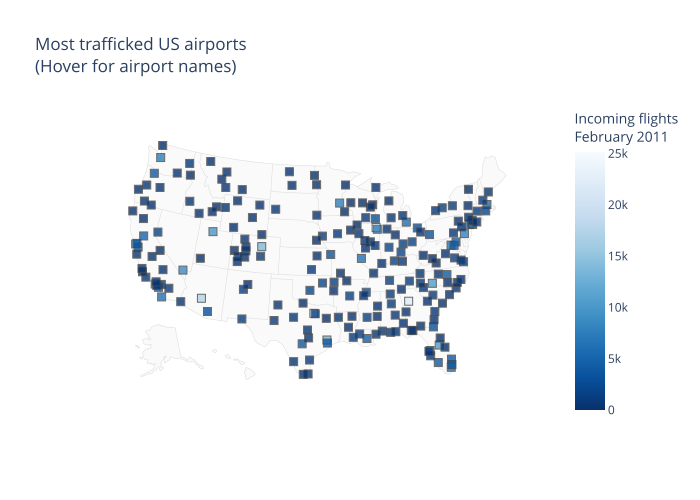

In [3]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df['text'] = df['airport'] + '' + df['city'] + ', ' + df['state'] + '' + 'Arrivals: ' + df['cnt'].astype(str)


fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = df['long'],
        lat = df['lat'],
        text = df['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = 0,
            color = df['cnt'],
            cmax = df['cnt'].max(),
            colorbar_title="Incoming flights<br>February 2011"
        )))

fig.update_layout(
        title = 'Most trafficked US airports<br>(Hover for airport names)',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

In [4]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2015_06_30_precipitation.csv')

scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],\
[0.375,"rgb(0, 152, 255)"],[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],\
[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

fig = go.Figure(data=go.Scattergeo(
    lat = df['Lat'],
    lon = df['Lon'],
    text = df['Globvalue'].astype(str) + ' inches',
    marker = dict(
        color = df['Globvalue'],
        colorscale = scl,
        reversescale = True,
        opacity = 0.7,
        size = 2,
        colorbar = dict(
            titleside = "right",
            outlinecolor = "rgba(68, 68, 68, 0)",
            ticks = "outside",
            showticksuffix = "last",
            dtick = 0.1
        )
    )
))

fig.update_layout(
    geo = dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -140.0, -55.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 60.0 ],
            dtick = 5
        )
    ),
    title='US Precipitation 06-30-2015<br>Source: <a href="http://water.weather.gov/precip/">NOAA</a>',
)
fig.show()

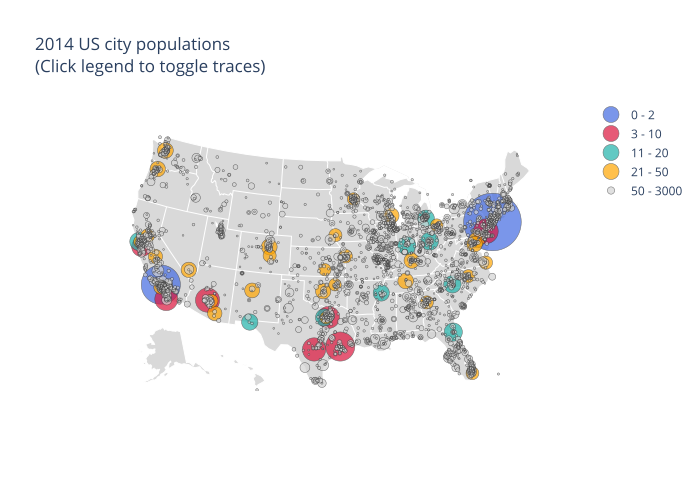

In [5]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
df.head()

df['text'] = df['name'] + '<br>Population ' + (df['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['pop']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2014 US city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

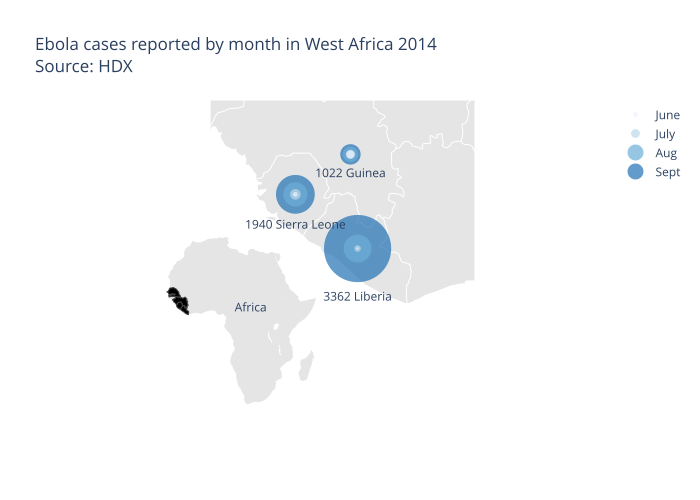

In [6]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_ebola.csv')
df.head()

colors = ['rgb(239,243,255)','rgb(189,215,231)','rgb(107,174,214)','rgb(33,113,181)']
months = {6:'June',7:'July',8:'Aug',9:'Sept'}

fig = go.Figure()

for i in range(6,10)[::-1]:
    df_month = df.query('Month == %d' %i)
    fig.add_trace(go.Scattergeo(
            lon = df_month['Lon'],
            lat = df_month['Lat'],
            text = df_month['Value'],
            name = months[i],
            marker = dict(
                size = df_month['Value']/50,
                color = colors[i-6],
                line_width = 0
            )))

df_sept = df.query('Month == 9')
fig['data'][0].update(mode='markers+text', textposition='bottom center',
                      text=df_sept['Value'].map('{:.0f}'.format).astype(str)+' '+\
                      df_sept['Country'])

# Inset
fig.add_trace(go.Choropleth(
        locationmode = 'country names',
        locations = df_sept['Country'],
        z = df_sept['Value'],
        text = df_sept['Country'],
        colorscale = [[0,'rgb(0, 0, 0)'],[1,'rgb(0, 0, 0)']],
        autocolorscale = False,
        showscale = False,
        geo = 'geo2'
    ))
fig.add_trace(go.Scattergeo(
        lon = [21.0936],
        lat = [7.1881],
        text = ['Africa'],
        mode = 'text',
        showlegend = False,
        geo = 'geo2'
    ))

fig.update_layout(
    title = go.layout.Title(
        text = 'Ebola cases reported by month in West Africa 2014<br> \
Source: <a href="https://data.hdx.rwlabs.org/dataset/rowca-ebola-cases">\
HDX</a>'),
    geo = go.layout.Geo(
        resolution = 50,
        scope = 'africa',
        showframe = False,
        showcoastlines = True,
        landcolor = "rgb(229, 229, 229)",
        countrycolor = "white" ,
        coastlinecolor = "white",
        projection_type = 'mercator',
        lonaxis_range= [ -15.0, -5.0 ],
        lataxis_range= [ 0.0, 12.0 ],
        domain = dict(x = [ 0, 1 ], y = [ 0, 1 ])
    ),
    geo2 = go.layout.Geo(
        scope = 'africa',
        showframe = False,
        landcolor = "rgb(229, 229, 229)",
        showcountries = False,
        domain = dict(x = [ 0, 0.6 ], y = [ 0, 0.6 ]),
        bgcolor = 'rgba(255, 255, 255, 0.0)',
    ),
    legend_traceorder = 'reversed'
)

fig.show()

## Mixed Subplot

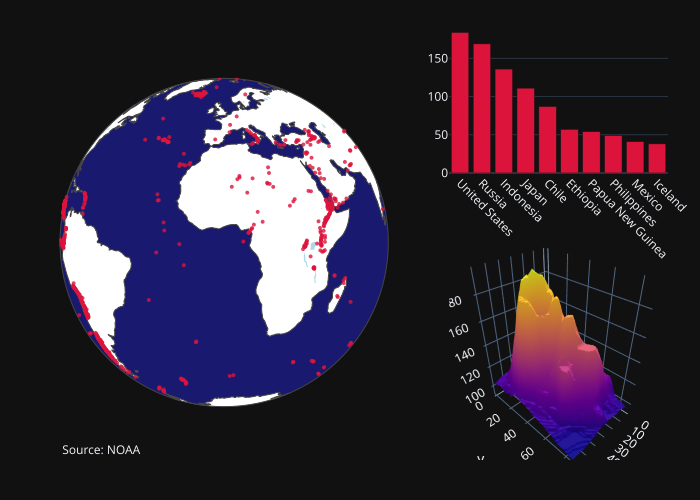

In [7]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pandas as pd

# read in volcano database data
df = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/volcano_db.csv",
    encoding="iso-8859-1",
)

# frequency of Country
freq = df
freq = freq.Country.value_counts().reset_index().rename(columns={"index": "x"})

# read in 3d volcano surface data
df_v = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv")

# Initialize figure with subplots
fig = make_subplots(
    rows=2, cols=2,
    column_widths=[0.6, 0.4],
    row_heights=[0.4, 0.6],
    specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
           [            None                    , {"type": "surface"}]])

# Add scattergeo globe map of volcano locations
fig.add_trace(
    go.Scattergeo(lat=df["Latitude"],
                  lon=df["Longitude"],
                  mode="markers",
                  hoverinfo="text",
                  showlegend=False,
                  marker=dict(color="crimson", size=4, opacity=0.8)),
    row=1, col=1
)

# Add locations bar chart
fig.add_trace(
    go.Bar(x=freq["x"][0:10],y=freq["Country"][0:10], marker=dict(color="crimson"), showlegend=False),
    row=1, col=2
)

# Add 3d surface of volcano
fig.add_trace(
    go.Surface(z=df_v.values.tolist(), showscale=False),
    row=2, col=2
)

# Update geo subplot properties
fig.update_geos(
    projection_type="orthographic",
    landcolor="white",
    oceancolor="MidnightBlue",
    showocean=True,
    lakecolor="LightBlue"
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

# Set theme, margin, and annotation in layout
fig.update_layout(
    template="plotly_dark",
    margin=dict(r=10, t=25, b=40, l=60),
    annotations=[
        dict(
            text="Source: NOAA",
            showarrow=False,
            xref="paper",
            yref="paper",
            x=0,
            y=0)
    ]
)

fig.show()

In [8]:
import plotly.graph_objects as go
import pandas as pd
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/1962_2006_walmart_store_openings.csv')
df.head()

data = []
layout = dict(
    title = 'New Walmart Stores per year 1962-2006<br>\
Source: <a href="http://www.econ.umn.edu/~holmes/data/WalMart/index.html">\
University of Minnesota</a>',
    # showlegend = False,
    autosize = False,
    width = 1000,
    height = 900,
    hovermode = False,
    legend = dict(
        x=0.7,
        y=-0.1,
        bgcolor="rgba(255, 255, 255, 0)",
        font = dict( size=11 ),
    )
)
years = df['YEAR'].unique()

for i in range(len(years)):
    geo_key = 'geo'+str(i+1) if i != 0 else 'geo'
    lons = list(df[ df['YEAR'] == years[i] ]['LON'])
    lats = list(df[ df['YEAR'] == years[i] ]['LAT'])
    # Walmart store data
    data.append(
        dict(
            type = 'scattergeo',
            showlegend=False,
            lon = lons,
            lat = lats,
            geo = geo_key,
            name = int(years[i]),
            marker = dict(
                color = "rgb(0, 0, 255)",
                opacity = 0.5
            )
        )
    )
    # Year markers
    data.append(
        dict(
            type = 'scattergeo',
            showlegend = False,
            lon = [-78],
            lat = [47],
            geo = geo_key,
            text = [years[i]],
            mode = 'text',
        )
    )
    layout[geo_key] = dict(
        scope = 'usa',
        showland = True,
        landcolor = 'rgb(229, 229, 229)',
        showcountries = False,
        domain = dict( x = [], y = [] ),
        subunitcolor = "rgb(255, 255, 255)",
    )


def draw_sparkline( domain, lataxis, lonaxis ):
    ''' Returns a sparkline layout object for geo coordinates  '''
    return dict(
        showland = False,
        showframe = False,
        showcountries = False,
        showcoastlines = False,
        domain = domain,
        lataxis = lataxis,
        lonaxis = lonaxis,
        bgcolor = 'rgba(255,200,200,0.0)'
    )

# Stores per year sparkline
layout['geo44'] = draw_sparkline({'x':[0.6,0.8], 'y':[0,0.15]}, \
                                 {'range':[-5.0, 30.0]}, {'range':[0.0, 40.0]} )
data.append(
    dict(
        type = 'scattergeo',
        mode = 'lines',
        lat = list(df.groupby(by=['YEAR']).count()['storenum']/1e1),
        lon = list(range(len(df.groupby(by=['YEAR']).count()['storenum']/1e1))),
        line = dict( color = "rgb(0, 0, 255)" ),
        name = "New stores per year<br>Peak of 178 stores per year in 1990",
        geo = 'geo44',
    )
)

# Cumulative sum sparkline
layout['geo45'] = draw_sparkline({'x':[0.8,1], 'y':[0,0.15]}, \
                                 {'range':[-5.0, 50.0]}, {'range':[0.0, 50.0]} )
data.append(
    dict(
        type = 'scattergeo',
        mode = 'lines',
        lat = list(df.groupby(by=['YEAR']).count().cumsum()['storenum']/1e2),
        lon = list(range(len(df.groupby(by=['YEAR']).count()['storenum']/1e1))),
        line = dict( color = "rgb(214, 39, 40)" ),
        name ="Cumulative sum<br>3176 stores total in 2006",
        geo = 'geo45',
    )
)

z = 0
COLS = 5
ROWS = 9
for y in reversed(range(ROWS)):
    for x in range(COLS):
        geo_key = 'geo'+str(z+1) if z != 0 else 'geo'
        layout[geo_key]['domain']['x'] = [float(x)/float(COLS), float(x+1)/float(COLS)]
        layout[geo_key]['domain']['y'] = [float(y)/float(ROWS), float(y+1)/float(ROWS)]
        z=z+1
        if z > 42:
            break

fig = go.Figure(data=data, layout=layout)
fig.update_layout(width=800)
fig.show()